In [1]:
%pip install pandas numpy matplotlib plotly seaborn
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import plotly.express as px


^C
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
# Device_id – уникальный идентификатор девайса отправителя события
# Device_type – тип девайса
# Datetime – время отправки события
# Ev_type – тип события (0 – показ, 1 – клик)
# Adv_type – тип рекламы
# Region_id – регион отправителя события
# Age – возраст отправителя события
# Gender – пол отправителя события (1 – женщины, 2 – мужчины)

In [ ]:
data = pd.read_csv('python_task_dataset.csv')
data.head()

,device_id,device_type,datetime,ev_type,adv_type,region_id,age,gender
0,100001,android,2019-03-01 15:58:02,0,multi,2,14,2
1,100001,android,2019-03-01 17:13:53,0,multi,2,14,2
2,100002,android,2019-03-01 23:13:25,0,multi,2,0,0
3,100002,android,2019-03-01 23:25:06,0,multi,2,0,0
4,100003,android,2019-03-01 15:27:53,0,multi,1,0,0


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265403 entries, 0 to 265402
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   device_id    265403 non-null  int64 
 1   device_type  265403 non-null  object
 2   datetime     265403 non-null  object
 3   ev_type      265403 non-null  int64 
 4   adv_type     265403 non-null  object
 5   region_id    265403 non-null  int64 
 6   age          265403 non-null  int64 
 7   gender       265403 non-null  int64 
dtypes: int64(5), object(3)
memory usage: 16.2+ MB


In [ ]:
data.isna().sum()

device_id      0
device_type    0
datetime       0
ev_type        0
adv_type       0
region_id      0
age            0
gender         0
dtype: int64

In [ ]:
clicks = data['adv_type']  # Пример списка кликов
total_clicks = len(clicks)
print(total_clicks)

265403


In [ ]:
px.histogram(data, y='ev_type', x='device_id', color='gender', marginal='box')

      device_id  click_count
0        100007            1
1        100020            1
2        100042            1
3        100193            1
4        100246            1
...         ...          ...
4037     286942            1
4038     286952            1
4039     286971            1
4040     287005            1
4041     287125            1

[4042 rows x 2 columns]


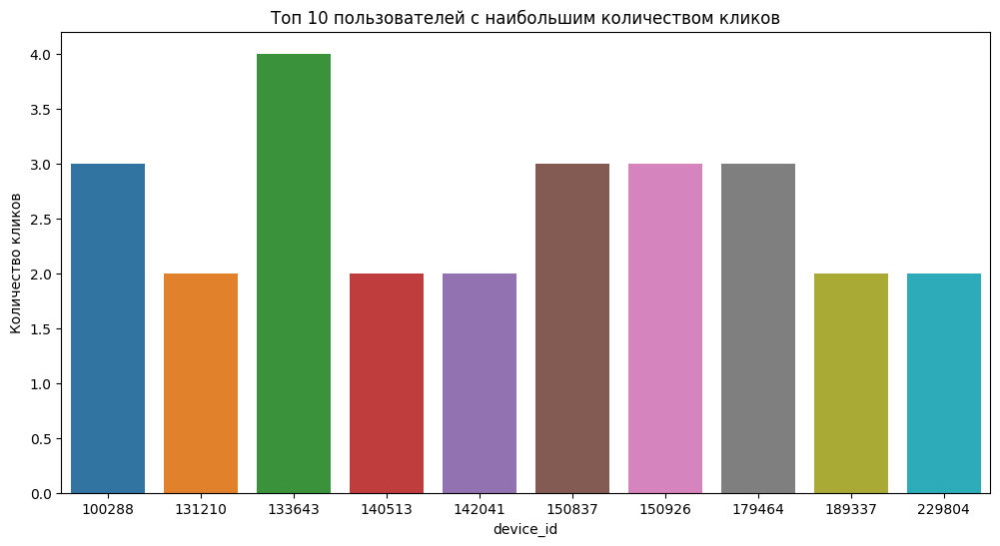

In [ ]:
df = pd.read_csv('python_task_dataset.csv')

clicks_df = df[df['ev_type'] == 1]
user_clicks = clicks_df.groupby('device_id').size().reset_index(name='click_count')
print(user_clicks)

sorted_user_clicks = user_clicks.sort_values(by='click_count', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=sorted_user_clicks.head(10), x='device_id', y='click_count')
plt.xlabel('device_id')
plt.ylabel('Количество кликов')
plt.title('Топ 10 пользователей с наибольшим количеством кликов')
plt.show()

([<matplotlib.patches.Wedge at 0x19872ba2200>,
 [Text(-0.9860850259191549, 0.4874795602463962, 'female'),
  Text(0.9184759609015558, -0.6053114150963651, 'unknown'),
  Text(1.0916112096944697, -0.1355911754848983, 'male')])

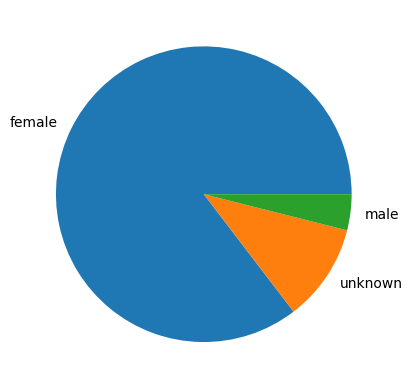

In [ ]:
plt.pie(data["gender"].value_counts(), labels = ["female","unknown","male"])

In [ ]:
#диссперсионный анализ

In [ ]:
data['adv_type'].value_counts

<bound method IndexOpsMixin.value_counts of 0         multi
1         multi
2         multi
3         multi
4         multi
          ...  
265398    video
265399    video
265400    video
265401    video
265402    video
Name: adv_type, Length: 265403, dtype: object>

In [ ]:
device_column = data['device_type']
print(device_column)

0         android
1         android
2         android
3         android
4         android
           ...   
265398    android
265399    android
265400    android
265401    android
265402    android
Name: device_type, Length: 265403, dtype: object


In [ ]:

import scipy.stats as stats



data_group1 = data['adv_type']
data_group2 = data['gender']
data_group3 = data['device_type']
data_group4 = data['ev_type' ]


f_value, p_value = stats.f_oneway(data_group1,data_group4)


print("F value:", f_value)
print("p value:", p_value)


ValueError: could not convert string to float: 'multi'